In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from pandas_profiling import ProfileReport

In [3]:
#profile = ProfileReport(data, title="Pandas Profiling Report")

In [4]:
df = pd.read_csv('E:/Data Science/1.Courses/7. Python for Data Science 2021/TensorFlow_FILES/DATA/kc_house_data.csv')

In [5]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [6]:
df['date']

0        10/13/2014
1         12/9/2014
2         2/25/2015
3         12/9/2014
4         2/18/2015
            ...    
21592     5/21/2014
21593     2/23/2015
21594     6/23/2014
21595     1/16/2015
21596    10/15/2014
Name: date, Length: 21597, dtype: object

In [7]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21597.0,4.580474e+09,2.876736e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21597.0,5.402966e+05,3.673681e+05,7.800000e+04,3.220000e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21597.0,3.373200e+00,9.262989e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21597.0,2.115826e+00,7.689843e-01,5.000000e-01,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21597.0,2.080322e+03,9.181061e+02,3.700000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21597.0,1.509941e+04,4.141264e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068500e+04,1.651359e+06
floors,21597.0,1.494096e+00,5.396828e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21597.0,7.547345e-03,8.654900e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21597.0,2.342918e-01,7.663898e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21597.0,3.409825e+00,6.505456e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


In [8]:
df.drop('id', inplace = True, axis = 1)

In [9]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Let's do some EDA using pandas profiling

In [10]:
profile = ProfileReport(df, title="Pandas Profiling Report")

### We encounter 3 issues, that we will resolve as we progress further

In [11]:
profile

In [12]:
df.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

### We will try to understand our independent feature PRICE and also try to make our data more apt towards outliers

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

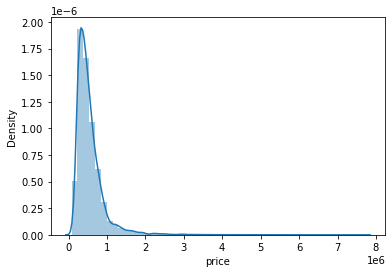

In [13]:
sns.distplot(df['price'])

<AxesSubplot:xlabel='price', ylabel='bedrooms'>

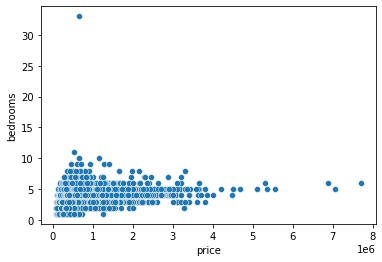

In [14]:
sns.scatterplot(x='price' , y = 'bedrooms', data=df)
#plt.yticks(rotation = 45)

In [15]:
df['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

<AxesSubplot:xlabel='price', ylabel='bedrooms'>

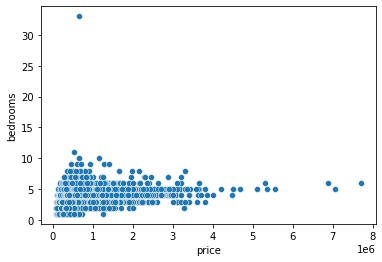

In [16]:
sns.scatterplot(x='price' , y = 'bedrooms', data=df)

### We delete records that come across as outliers for setting our data as below. That's not even 1% of data that we remove

In [17]:
df_filter = df[(df['price'] < 4000001) & (df['bedrooms'] <= 9)]

In [18]:
print(df.shape)
print(df_filter.shape)

(21597, 20)
(21581, 20)


### Now the price featuer appears to be somewhere like normal

<AxesSubplot:xlabel='price', ylabel='bedrooms'>

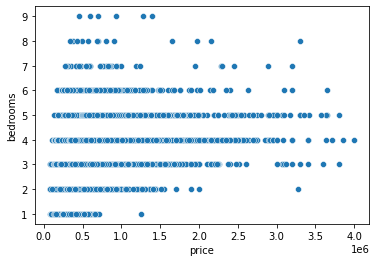

In [19]:
sns.scatterplot(x='price' , y = 'bedrooms', data=df_filter)

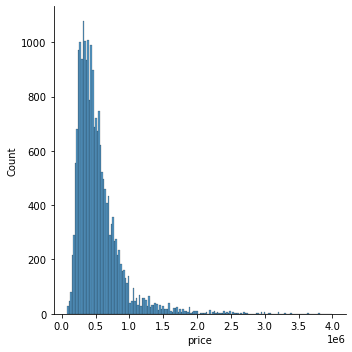

In [20]:
sns.displot(df_filter['price'])

In [21]:
df_filter['price'].sort_values(ascending=False)

4145     4000000.0
2083     3850000.0
19002    3800000.0
7028     3800000.0
16288    3710000.0
           ...    
2139       82500.0
8267       82000.0
16184      81000.0
465        80000.0
15279      78000.0
Name: price, Length: 21581, dtype: float64

In [22]:
df_filter.corr()['price'].sort_values(ascending=False)

price            1.000000
sqft_living      0.694630
grade            0.677900
sqft_above       0.599047
sqft_living15    0.596981
bathrooms        0.521303
view             0.396434
lat              0.319510
bedrooms         0.318895
sqft_basement    0.312677
floors           0.263996
waterfront       0.248356
yr_renovated     0.123258
sqft_lot         0.092043
sqft_lot15       0.084711
yr_built         0.054439
condition        0.040147
long             0.024319
zipcode         -0.051436
Name: price, dtype: float64

### We try to see any relation with the latitude and longitude co-ordiantes, regarding if price has some impact

<AxesSubplot:xlabel='long', ylabel='lat'>

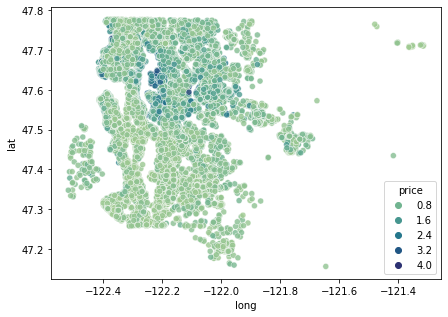

In [23]:
plt.figure(figsize=(7,5))
sns.scatterplot(x='long', y='lat', data = df_filter, alpha = 0.8, hue = 'price', palette = 'crest')

In [24]:
df1 = df_filter

In [25]:
df_filter.reset_index(drop = True, inplace = True)

### Let's do some feature extraction and handle date feature

In [26]:
df_filter['dates'] = pd.to_datetime(df_filter['date'])

<ipython-input-26-a02dfd47dfd3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter['dates'] = pd.to_datetime(df_filter['date'])


In [27]:
df_filter['dates']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21576   2014-05-21
21577   2015-02-23
21578   2014-06-23
21579   2015-01-16
21580   2014-10-15
Name: dates, Length: 21581, dtype: datetime64[ns]

In [28]:
df_filter['year'] = df_filter['dates'].dt.year

<ipython-input-28-c58d190c7890>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter['year'] = df_filter['dates'].dt.year


In [29]:
df_filter['year']

0        2014
1        2014
2        2015
3        2014
4        2015
         ... 
21576    2014
21577    2015
21578    2014
21579    2015
21580    2014
Name: year, Length: 21581, dtype: int64

In [30]:
df_filter['month'] = df_filter['dates'].apply(lambda x : x.month)

<ipython-input-30-8223a8f9f8f7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter['month'] = df_filter['dates'].apply(lambda x : x.month)


In [31]:
df_filter.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'dates', 'year', 'month'],
      dtype='object')

In [32]:
df_filter.drop('date', axis = 1, inplace = True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [33]:
df_filter[['price', 'year', 'month']]

,price,year,month
0,221900.0,2014,10
1,538000.0,2014,12
2,180000.0,2015,2
3,604000.0,2014,12
4,510000.0,2015,2
...,...,...,...
21576,360000.0,2014,5
21577,400000.0,2015,2
21578,402101.0,2014,6
21579,400000.0,2015,1


In [34]:
df_filter.corr()['price'].sort_values(ascending=False)

price            1.000000
sqft_living      0.694630
grade            0.677900
sqft_above       0.599047
sqft_living15    0.596981
bathrooms        0.521303
view             0.396434
lat              0.319510
bedrooms         0.318895
sqft_basement    0.312677
floors           0.263996
waterfront       0.248356
yr_renovated     0.123258
sqft_lot         0.092043
sqft_lot15       0.084711
yr_built         0.054439
condition        0.040147
long             0.024319
year             0.005290
month           -0.011803
zipcode         -0.051436
Name: price, dtype: float64

In [35]:
df_filter[df_filter['year'] < 2014 ]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,dates,year,month


### Month shows some importance as a feature for any variation in price when we look at the lineplot

<AxesSubplot:xlabel='month', ylabel='price'>

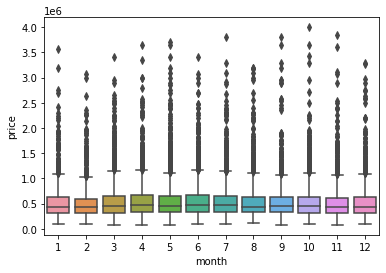

In [36]:
sns.boxplot(x = 'month', y = 'price', data =df_filter)

<AxesSubplot:xlabel='month'>

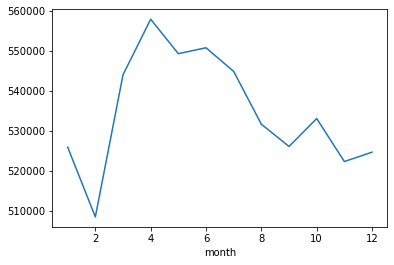

In [37]:
df_filter.groupby('month').mean()['price'].plot()

In [38]:
df_filter.groupby('year').mean()['price']

year
2014    536435.008009
2015    540380.961847
Name: price, dtype: float64

<AxesSubplot:xlabel='year'>

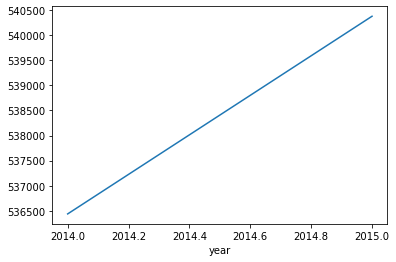

In [39]:
df_filter.groupby('year').mean()['price'].plot()

In [40]:
df_filter.drop('dates', axis = 1, inplace = True)
data = df_filter

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [41]:
df_filter.drop('zipcode', axis = 1, inplace = True)

In [42]:
df_filter

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,47.5112,-122.257,1340,5650,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,47.7210,-122.319,1690,7639,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,47.7379,-122.233,2720,8062,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,47.5208,-122.393,1360,5000,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,47.6168,-122.045,1800,7503,2015,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21576,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,47.6993,-122.346,1530,1509,2014,5
21577,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,47.5107,-122.362,1830,7200,2015,2
21578,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,47.5944,-122.299,1020,2007,2014,6
21579,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,47.5345,-122.069,1410,1287,2015,1


### Let's deal with below two features that hold maximum values as zeros, which means no basement and no renovation and convert them to binary categorical feature values

In [43]:
def parser(x):
    if x>=1 :
        return 1
    else :
        return 0
df['bsmt'] = df['sqft_basement'].apply(parser)   

In [44]:
df_filter['bsmt'] = df_filter['sqft_basement'].apply(parser)

<ipython-input-44-87b7e66200ab>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter['bsmt'] = df_filter['sqft_basement'].apply(parser)


In [45]:
df_filter['bsmt']

0        0
1        1
2        0
3        1
4        0
        ..
21576    0
21577    0
21578    0
21579    0
21580    0
Name: bsmt, Length: 21581, dtype: int64

In [46]:
df_filter.drop('sqft_basement', axis=1, inplace = True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [47]:
df_filter

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,year,month,bsmt
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,1955,0,47.5112,-122.257,1340,5650,2014,10,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,1951,1991,47.7210,-122.319,1690,7639,2014,12,1
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,1933,0,47.7379,-122.233,2720,8062,2015,2,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,1965,0,47.5208,-122.393,1360,5000,2014,12,1
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,1987,0,47.6168,-122.045,1800,7503,2015,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21576,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,2009,0,47.6993,-122.346,1530,1509,2014,5,0
21577,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,2014,0,47.5107,-122.362,1830,7200,2015,2,0
21578,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,2009,0,47.5944,-122.299,1020,2007,2014,6,0
21579,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,2004,0,47.5345,-122.069,1410,1287,2015,1,0


In [48]:
df_filter['renovation'] = df_filter['yr_renovated'].apply(parser)

<ipython-input-48-30b17f906331>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter['renovation'] = df_filter['yr_renovated'].apply(parser)


In [49]:
df_filter.drop('yr_renovated', axis=1, inplace = True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [50]:
df_filter

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,lat,long,sqft_living15,sqft_lot15,year,month,bsmt,renovation
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,1955,47.5112,-122.257,1340,5650,2014,10,0,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,1951,47.7210,-122.319,1690,7639,2014,12,1,1
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,1933,47.7379,-122.233,2720,8062,2015,2,0,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,1965,47.5208,-122.393,1360,5000,2014,12,1,0
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,1987,47.6168,-122.045,1800,7503,2015,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21576,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,2009,47.6993,-122.346,1530,1509,2014,5,0,0
21577,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,2014,47.5107,-122.362,1830,7200,2015,2,0,0
21578,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,2009,47.5944,-122.299,1020,2007,2014,6,0,0
21579,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,2004,47.5345,-122.069,1410,1287,2015,1,0,0


In [51]:
data = df_filter

In [52]:
data.to_csv('E:/Data Science/1.Courses/7. Python for Data Science 2021/TensorFlow_FILES/DATA/kc_finaldata.csv',index=False)

In [53]:
data.shape

(21581, 20)

## Time to apply Machine Learning

In [54]:
#from sklearn.linear_model import LinearRegression, Lasso, Ridge
#from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
#from xgboost import XGBRegressor
#from sklearn.model_selection import RandomizedSearchCV

In [70]:
X = data.drop(['price'], axis = 1)
y = data['price']

In [56]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [57]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.25, random_state=101)

In [58]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [59]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error
import sklearn.metrics as sm

In [60]:
LRreg = LinearRegression()

In [61]:
LRreg.fit(X_train, y_train)
LRpred = LRreg.predict(X_test)
print("RMSE =",round(np.sqrt(mean_squared_error(y_test, LRpred)),2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, LRpred), 2)) 
print("R2 score =", round(sm.r2_score(y_test, LRpred), 2))

RMSE = 183602.01
Explain variance score = 0.71
R2 score = 0.71


In [68]:
RFreg = RandomForestRegressor()

In [67]:
RFreg.fit(X_train, y_train)
RFpred = RFreg.predict(X_test)
print("RMSE =",round(np.sqrt(mean_squared_error(y_test, RFpred)),2))
print("Explain variance score =", round(sm.explained_variance_score(y_test, RFpred), 2)) 
print("R2 score =", round(sm.r2_score(y_test, RFpred), 2))

RMSE = 120658.61
Explain variance score = 0.87
R2 score = 0.87


## Will add the hyperparameter tuning code later in another notebook, as the notebook checkpoint got overwritten and the hyperparameter values as well as codes have disappeared in this notebook.

### I used Grid search twice to get optimised values for result.
### Later I will also implement adaboost and xgboost

### Let's implement a simple Deep Learning network model

In [64]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [71]:
X = data.drop(['price'], axis = 1).values
y = data['price'].values

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.25, random_state=101)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [73]:
X_train.shape

(16185, 19)

In [69]:
model = Sequential()

In [75]:
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))

model.add(Dense(1))

model.compile(optimizer ='adam', loss = 'mse')

In [78]:
model.fit(x= X_train, y= y_train, validation_data= (X_test, y_test), batch_size = 128, epochs=400)

Epoch 1/400
127/127 [==============================] - 8s 32ms/step - loss: 37583843328.0000 - val_loss: 35734495232.0000
Epoch 2/400
127/127 [==============================] - 5s 36ms/step - loss: 35887706112.0000 - val_loss: 34341240832.0000
Epoch 3/400
127/127 [==============================] - 4s 34ms/step - loss: 34647568384.0000 - val_loss: 33259720704.0000
Epoch 4/400
127/127 [==============================] - 4s 31ms/step - loss: 33661038592.0000 - val_loss: 32497735680.0000
Epoch 5/400
127/127 [==============================] - 4s 29ms/step - loss: 32914573312.0000 - val_loss: 31946807296.0000
Epoch 6/400
127/127 [==============================] - 4s 29ms/step - loss: 32330516480.0000 - val_loss: 31302805504.0000
Epoch 7/400
127/127 [==============================] - 5s 37ms/step - loss: 31948351488.0000 - val_loss: 31283298304.0000
Epoch 8/400
127/127 [==============================] - 4s 33ms/step - loss: 31395512320.0000 - val_loss: 30747049984.0000
Epoch 9/400
127/127 [===

127/127 [==============================] - 4s 28ms/step - loss: 22269988864.0000 - val_loss: 24184086528.0000
Epoch 68/400
127/127 [==============================] - 4s 36ms/step - loss: 22281842688.0000 - val_loss: 23553343488.0000
Epoch 69/400
127/127 [==============================] - 4s 35ms/step - loss: 22193432576.0000 - val_loss: 23346630656.0000
Epoch 70/400
127/127 [==============================] - 4s 35ms/step - loss: 21992261632.0000 - val_loss: 23582601216.0000
Epoch 71/400
127/127 [==============================] - 4s 32ms/step - loss: 21939277824.0000 - val_loss: 23133143040.0000
Epoch 72/400
127/127 [==============================] - 5s 38ms/step - loss: 22012600320.0000 - val_loss: 23404513280.0000
Epoch 73/400
127/127 [==============================] - 4s 31ms/step - loss: 21900591104.0000 - val_loss: 23386533888.0000
Epoch 74/400
127/127 [==============================] - 4s 32ms/step - loss: 21958445056.0000 - val_loss: 23099922432.0000
Epoch 75/400
127/127 [=======

127/127 [==============================] - 4s 31ms/step - loss: 20274276352.0000 - val_loss: 22212636672.0000
Epoch 134/400
127/127 [==============================] - 5s 37ms/step - loss: 20346152960.0000 - val_loss: 22176583680.0000
Epoch 135/400
127/127 [==============================] - 4s 32ms/step - loss: 20261818368.0000 - val_loss: 22313449472.0000
Epoch 136/400
127/127 [==============================] - 4s 31ms/step - loss: 20186406912.0000 - val_loss: 22125166592.0000
Epoch 137/400
127/127 [==============================] - 4s 29ms/step - loss: 20242745344.0000 - val_loss: 22245105664.0000
Epoch 138/400
127/127 [==============================] - 4s 29ms/step - loss: 20213016576.0000 - val_loss: 22371749888.0000
Epoch 139/400
127/127 [==============================] - 4s 35ms/step - loss: 20121356288.0000 - val_loss: 22066595840.0000
Epoch 140/400
127/127 [==============================] - 4s 30ms/step - loss: 20297424896.0000 - val_loss: 22989574144.0000
Epoch 141/400
127/127 

127/127 [==============================] - 3s 27ms/step - loss: 18268145664.0000 - val_loss: 20681889792.0000
Epoch 200/400
127/127 [==============================] - 4s 36ms/step - loss: 18187261952.0000 - val_loss: 20929372160.0000
Epoch 201/400
127/127 [==============================] - 4s 33ms/step - loss: 18176526336.0000 - val_loss: 20363266048.0000
Epoch 202/400
127/127 [==============================] - 3s 25ms/step - loss: 17869701120.0000 - val_loss: 20307195904.0000
Epoch 203/400
127/127 [==============================] - 5s 36ms/step - loss: 17868437504.0000 - val_loss: 20099436544.0000
Epoch 204/400
127/127 [==============================] - 4s 29ms/step - loss: 17763377152.0000 - val_loss: 20186118144.0000
Epoch 205/400
127/127 [==============================] - 4s 34ms/step - loss: 17554171904.0000 - val_loss: 20235778048.0000
Epoch 206/400
127/127 [==============================] - 4s 31ms/step - loss: 17528399872.0000 - val_loss: 19963281408.0000
Epoch 207/400
127/127 

127/127 [==============================] - 4s 28ms/step - loss: 13220828160.0000 - val_loss: 15630967808.0000
Epoch 266/400
127/127 [==============================] - 5s 38ms/step - loss: 13131800576.0000 - val_loss: 15982319616.0000
Epoch 267/400
127/127 [==============================] - 4s 31ms/step - loss: 13102531584.0000 - val_loss: 15449815040.0000
Epoch 268/400
127/127 [==============================] - 4s 33ms/step - loss: 13282112512.0000 - val_loss: 15401423872.0000
Epoch 269/400
127/127 [==============================] - 4s 35ms/step - loss: 13160411136.0000 - val_loss: 15406183424.0000
Epoch 270/400
127/127 [==============================] - 6s 47ms/step - loss: 13029204992.0000 - val_loss: 15437316096.0000
Epoch 271/400
127/127 [==============================] - 4s 34ms/step - loss: 12822921216.0000 - val_loss: 15766396928.0000
Epoch 272/400
127/127 [==============================] - 4s 33ms/step - loss: 12980544512.0000 - val_loss: 15490948096.0000
Epoch 273/400
127/127 

127/127 [==============================] - 5s 41ms/step - loss: 11338773504.0000 - val_loss: 14920783872.0000
Epoch 332/400
127/127 [==============================] - 5s 42ms/step - loss: 11319950336.0000 - val_loss: 14741612544.0000
Epoch 333/400
127/127 [==============================] - 5s 40ms/step - loss: 11348166656.0000 - val_loss: 15314967552.0000
Epoch 334/400
127/127 [==============================] - 6s 49ms/step - loss: 11271091200.0000 - val_loss: 15313944576.0000
Epoch 335/400
127/127 [==============================] - 6s 47ms/step - loss: 11259791360.0000 - val_loss: 15107148800.0000
Epoch 336/400
127/127 [==============================] - 6s 46ms/step - loss: 11249060864.0000 - val_loss: 15227193344.0000
Epoch 337/400
127/127 [==============================] - 4s 32ms/step - loss: 11317341184.0000 - val_loss: 15110561792.0000
Epoch 338/400
127/127 [==============================] - 4s 30ms/step - loss: 11309182976.0000 - val_loss: 14966313984.0000
Epoch 339/400
127/127 

127/127 [==============================] - 3s 26ms/step - loss: 10670277632.0000 - val_loss: 15195630592.0000
Epoch 398/400
127/127 [==============================] - 5s 37ms/step - loss: 10647974912.0000 - val_loss: 15374403584.0000
Epoch 399/400
127/127 [==============================] - 3s 28ms/step - loss: 10561345536.0000 - val_loss: 15755461632.0000
Epoch 400/400
127/127 [==============================] - 4s 34ms/step - loss: 10569871360.0000 - val_loss: 14875668480.0000


In [80]:
losses = pd.DataFrame(model.history.history)

<AxesSubplot:>

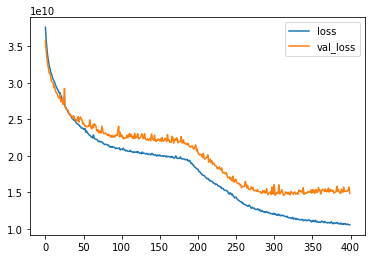

In [82]:
losses.plot()

In [84]:
ypred = model.predict(X_test)

In [89]:
from sklearn.metrics import mean_squared_error, explained_variance_score

In [86]:
np.sqrt(mean_squared_error(y_test,ypred))

121965.85099771226

In [90]:
explained_variance_score(y_test,ypred)

0.8709157662146906

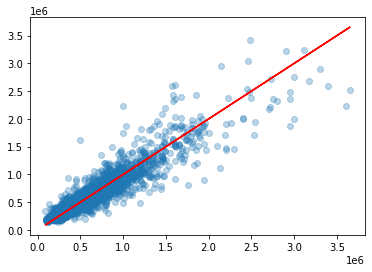

In [93]:
plt.scatter(y_test,ypred, alpha = 0.3)
plt.plot(y_test,y_test, 'r')